In [ ]:
! pip install mlflow --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 54.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 29.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.6/147.6 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.9/202.9 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 7.0 MB/s eta 0:00:00


In [ ]:
!pip install pyngrok --quiet

In [ ]:
!pip install google-cloud-storage --quiet

In [ ]:
!pip show tensorflow

Name: tensorflow
Version: 2.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine-rl


In [ ]:
import matplotlib.pyplot as plt
import gcsfs
from google.oauth2.service_account import Credentials
from PIL import Image
import numpy as np
import tensorflow as tf
from scipy.ndimage import convolve
from scipy.signal import convolve2d
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Activation,MaxPooling2D,BatchNormalization,Flatten,Dense,Dropout,Lambda
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.utils import plot_model
import datetime
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import mlflow
import mlflow.tensorflow
#from pyngrok import ngrok


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving myboschproject-c9f1adcd56d2.json to myboschproject-c9f1adcd56d2.json


In [ ]:
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/content/myboschproject-c9f1adcd56d2.json'

In [ ]:
! echo $GOOGLE_APPLICATION_CREDENTIALS

/content/myboschproject-c9f1adcd56d2.json


In [ ]:
#mlflow.tensorflow.autolog()
#get_ipython().system_raw("mlflow ui --port 5000 &")

In [ ]:
# Terminate open tunnels if exist
ngrok.kill()
ngrok.set_auth_token('2dHQZlos1TReQD4wrOClVjjqNaT_3982dHkcGeL9FGyBKBezH')
# Open an HTTPs tunnel on port 5000 for http://localhost:5000
ngrok_tunnel = ngrok.connect(addr="5000", proto="http", bind_tls=True)
print("MLflow Tracking UI:", ngrok_tunnel.public_url)
mlflow.set_tracking_uri(ngrok_tunnel.public_url)

MLflow Tracking UI: https://285f-34-125-134-140.ngrok-free.app


In [ ]:
mlflow.tensorflow.autolog()
mlflow.set_tracking_uri("http://13.83.126.56:5000/")

In [ ]:
experiment_name = "cats_dogs_alexnet"
mlflow.create_experiment(experiment_name)
mlflow.set_experiment(experiment_name)

<Experiment: artifact_location='mlflow-artifacts:/923890877345678606', creation_time=1709706886562, experiment_id='923890877345678606', last_update_time=1709706886562, lifecycle_stage='active', name='cats_dogs_alexnet', tags={}>

In [ ]:
mlflow_exp_id = mlflow.get_experiment_by_name("cats_dogs_alexnet").experiment_id
mlflow_exp_id

'923890877345678606'

In [ ]:
mlflow.set_experiment("cats_dogs_alexnet")

<Experiment: artifact_location='mlflow-artifacts:/923890877345678606', creation_time=1709706886562, experiment_id='923890877345678606', last_update_time=1709706886562, lifecycle_stage='active', name='cats_dogs_alexnet', tags={}>

In [ ]:
# Load the dataset
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)
# Define the directories
train_dir = "/root/.keras/datasets/cats_and_dogs_filtered/train"
validation_dir = "/root/.keras/datasets/cats_and_dogs_filtered/validation"

68606236/68606236 [==============================] - 0s 0us/step


In [ ]:
# Use ImageDataGenerator to preprocess your images

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=64,
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(224, 224),
        batch_size=64,
        class_mode='categorical')


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
# Original Alex net

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_71 (Conv2D)          (None, 54, 54, 96)        34944     
                                                                 
 activation_81 (Activation)  (None, 54, 54, 96)        0         
                                                                 
 batch_normalization_57 (Ba  (None, 54, 54, 96)        384       
 tchNormalization)                                               
                                                                 
 max_pooling2d_45 (MaxPooli  (None, 27, 27, 96)        0         
 ng2D)                                                           
                                                                 
 conv2d_72 (Conv2D)          (None, 23, 23, 256)       614656    
                                                                 
 activation_82 (Activation)  (None, 23, 23, 256)     

In [ ]:
# alexnet with crossentropy loss
# full alexnet
model = Sequential()
# Layer 1
model.add(Conv2D(24, (5, 5), input_shape=(224, 224, 3), strides=(4, 4), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Layer 2
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# # Layer 3
# model.add(Conv2D(384, (3, 3), strides=(1, 1), padding='same'))
# model.add(Activation('relu'))
#model.add(BatchNormalization())

# # Layer 4
# model.add(Conv2D(384, (3, 3), strides=(1, 1), padding='same'))
# model.add(Activation('relu'))
# #model.add(BatchNormalization())

# Layer 5
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(3, 3), padding='valid'))
model.add(BatchNormalization())

# Flatten
model.add(Flatten())

# Layer 6
model.add(Dense(288, input_shape=(224*224*3,)))
model.add(Activation('relu'))
model.add(Dropout(0.4))
model.add(BatchNormalization())

# # Layer 7
# model.add(Dense(4096))
# model.add(Activation('relu'))
# model.add(Dropout(0.4))
# model.add(BatchNormalization())

# Layer 8
model.add(Dense(2))
# model.add(Activation('relu'))
# model.add(Dropout(0.4))
# model.add(BatchNormalization())

# Output Layer
model.add(Activation('softmax'))

model.summary()

# Compile the model
model.compile(loss=tf.keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy'])
# Train the model
log_dir = "./logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
model.fit(
        train_generator,
        steps_per_epoch=2000/64,
        epochs=50,
        validation_data=validation_generator,
        validation_steps=1000/64,
        callbacks=[tensorboard_callback])

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_125 (Conv2D)         (None, 55, 55, 24)        1824      
                                                                 
 activation_155 (Activation  (None, 55, 55, 24)        0         
 )                                                               
                                                                 
 batch_normalization_124 (B  (None, 55, 55, 24)        96        
 atchNormalization)                                              
                                                                 
 max_pooling2d_121 (MaxPool  (None, 27, 27, 24)        0         
 ing2D)                                                          
                                                                 
 conv2d_126 (Conv2D)         (None, 25, 25, 32)        6944      
                                                     

In [ ]:
# alexnet with linear activation + hinge loss
model = Sequential()
# Layer 1
model.add(Conv2D(24, (5, 5), input_shape=(224, 224, 3), strides=(4, 4), padding='valid'))
model.add(Activation('relu'))

#model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Layer 2
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Layer 5
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
model.add(BatchNormalization())

# Flatten
model.add(Flatten())

# Layer 6
model.add(Dense(2, activation='linear', kernel_regularizer=tf.keras.regularizers.l2(0.01)))

# Output Layer
model.add(Activation('softmax'))
model.summary()

# Compile the model
model.compile(loss=tf.keras.losses.hinge, optimizer='adam', metrics=['accuracy'])
# Train the model
log_dir = "./logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
with mlflow.start_run() as run:
  mlflow.set_tag("mlflow.runName", "Conv2d_5_5_kernel_hinge")
  model.fit(
          train_generator,
          steps_per_epoch=2000/64,
          epochs=50,
          validation_data=validation_generator,
          validation_steps=1000/64,
          callbacks=[tensorboard_callback])

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_128 (Conv2D)         (None, 55, 55, 24)        1824      
                                                                 
 activation_160 (Activation  (None, 55, 55, 24)        0         
 )                                                               
                                                                 
 batch_normalization_128 (B  (None, 55, 55, 24)        96        
 atchNormalization)                                              
                                                                 
 max_pooling2d_124 (MaxPool  (None, 27, 27, 24)        0         
 ing2D)                                                          
                                                                 
 conv2d_129 (Conv2D)         (None, 25, 25, 32)        6944      
                                                     

In [ ]:
! pip show mlflow

Name: mlflow
Version: 2.11.0
Summary: MLflow: A Platform for ML Development and Productionization
Home-page: https://mlflow.org/
Author: Databricks
Author-email: 
License: Apache License 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: alembic, click, cloudpickle, docker, entrypoints, Flask, gitpython, graphene, gunicorn, importlib-metadata, Jinja2, markdown, matplotlib, numpy, packaging, pandas, protobuf, pyarrow, pytz, pyyaml, querystring-parser, requests, scikit-learn, scipy, sqlalchemy, sqlparse
Required-by: 


In [ ]:
# alexnet with linear activation w/o softmax + hinge loss
model = Sequential()
# Layer 1
model.add(Conv2D(24, (5, 5), input_shape=(224, 224, 3), strides=(4, 4), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Layer 2
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))

# Layer 5
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
model.add(BatchNormalization())

# Flatten
model.add(Flatten())

# Layer 6
model.add(Dense(2, activation='linear', kernel_regularizer=tf.keras.regularizers.l2(0.01)))

# Output Layer
model.summary()

# Compile the model
model.compile(loss=tf.keras.losses.hinge, optimizer='adam', metrics=['accuracy'])
# Train the model
#log_dir = "./logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
with mlflow.start_run() as run:
  mlflow.set_tag("mlflow.runName", "Conv2d_11_11_kernel_hinge_wo_softmax")
  model.fit(
          train_generator,
          steps_per_epoch=2000/64,
          epochs=50,
          validation_data=validation_generator,
          validation_steps=1000/64,
          ) #callbacks=[tensorboard_callback]

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 55, 55, 24)        1824      
                                                                 
 activation (Activation)     (None, 55, 55, 24)        0         
                                                                 
 batch_normalization (Batch  (None, 55, 55, 24)        96        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 27, 27, 24)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 25, 25, 32)        6944      
                                                                 
 activation_1 (Activation)   (None, 25, 25, 32)        0

2024/03/06 06:36:43 WARNING mlflow.tensorflow: Unrecognized dataset type <class 'keras.src.preprocessing.image.DirectoryIterator'>. Dataset logging skipped.
2024/03/06 06:36:43 WARNING mlflow.tensorflow: Unrecognized dataset type <class 'keras.src.preprocessing.image.DirectoryIterator'>. Dataset logging skipped.


Epoch 1/50
32/31 [==============================] - ETA: 0s - loss: 0.9965 - accuracy: 0.6135

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


31/31 [==============================] - 19s 376ms/step - loss: 0.9965 - accuracy: 0.6135 - val_loss: 1.0303 - val_accuracy: 0.5000
Epoch 2/50
31/31 [==============================] - 11s 354ms/step - loss: 0.7403 - accuracy: 0.7235 - val_loss: 1.0200 - val_accuracy: 0.5000
Epoch 3/50
31/31 [==============================] - 10s 338ms/step - loss: 0.6317 - accuracy: 0.7585 - val_loss: 1.0427 - val_accuracy: 0.5000
Epoch 4/50
31/31 [==============================] - 11s 365ms/step - loss: 0.5572 - accuracy: 0.7960 - val_loss: 1.0427 - val_accuracy: 0.5000
Epoch 5/50
31/31 [==============================] - 10s 319ms/step - loss: 0.4825 - accuracy: 0.8330 - val_loss: 1.0034 - val_accuracy: 0.5000
Epoch 6/50
31/31 [==============================] - 11s 359ms/step - loss: 0.4143 - accuracy: 0.8660 - val_loss: 1.0541 - val_accuracy: 0.5000
Epoch 7/50
31/31 [==============================] - 9s 286ms/step - loss: 0.3533 - accuracy: 0.8945 - val_loss: 1.0605 - val_accuracy: 0.5090
Epoch 8/50


2024/03/06 06:47:54 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: '>=' not supported between instances of 'slice' and 'int'
2024/03/06 06:47:54 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2024/03/06 06:48:03 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils."


In [ ]:

# alexnet with local normalization, linear activation w/o softmax + hinge loss
model = Sequential()
# Layer 1
model.add(Conv2D(24, (5, 5), input_shape=(224, 224, 3), strides=(4, 4), padding='valid'))
model.add(Activation('relu'))
#model.add(Lambda(tf.nn.local_response_normalization))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
model.add(Dropout(0.4))

# Layer 2
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
model.add(Dropout(0.4))

# Layer 5
model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='valid'))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
model.add(Dropout(0.4))

# Flatten
model.add(Flatten())

model.add(Dense(128, kernel_regularizer=tf.keras.regularizers.l2(0.01)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Layer 6
model.add(Dense(2, activation='linear', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
model.add(Activation('softmax'))

# Output Layer
model.summary()

# Compile the model
model.compile(loss=tf.keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy'])
# Train the model
#log_dir = "./logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
with mlflow.start_run() as run:
  mlflow.set_tag("mlflow.runName", "Conv2d_5_5_kernel_binary_cross_entopy_softmax_local_response_norm_w_dropout")
  model.fit(
          train_generator,
          steps_per_epoch=2000/64,
          epochs=50,
          validation_data=validation_generator,
          validation_steps=1000/64,
          ) #callbacks=[tensorboard_callback]

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_43 (Conv2D)          (None, 55, 55, 24)        1824      
                                                                 
 activation_56 (Activation)  (None, 55, 55, 24)        0         
                                                                 
 batch_normalization_12 (Ba  (None, 55, 55, 24)        96        
 tchNormalization)                                               
                                                                 
 max_pooling2d_42 (MaxPooli  (None, 27, 27, 24)        0         
 ng2D)                                                           
                                                                 
 dropout_18 (Dropout)        (None, 27, 27, 24)        0         
                                                                 
 conv2d_44 (Conv2D)          (None, 25, 25, 32)      

2024/03/07 00:21:18 WARNING mlflow.tensorflow: Unrecognized dataset type <class 'keras.src.preprocessing.image.DirectoryIterator'>. Dataset logging skipped.
2024/03/07 00:21:18 WARNING mlflow.tensorflow: Unrecognized dataset type <class 'keras.src.preprocessing.image.DirectoryIterator'>. Dataset logging skipped.


Epoch 1/50
31/31 [==============================] - 13s 347ms/step - loss: 2.9359 - accuracy: 0.5430 - val_loss: 2.5493 - val_accuracy: 0.5000
Epoch 2/50
31/31 [==============================] - 10s 325ms/step - loss: 2.4618 - accuracy: 0.5665 - val_loss: 2.3258 - val_accuracy: 0.5000
Epoch 3/50
31/31 [==============================] - 11s 352ms/step - loss: 2.1047 - accuracy: 0.6050 - val_loss: 2.0668 - val_accuracy: 0.5000
Epoch 4/50
31/31 [==============================] - 11s 348ms/step - loss: 1.8239 - accuracy: 0.6065 - val_loss: 1.8908 - val_accuracy: 0.5000
Epoch 5/50
31/31 [==============================] - 11s 353ms/step - loss: 1.6131 - accuracy: 0.6260 - val_loss: 1.7174 - val_accuracy: 0.5000
Epoch 6/50
31/31 [==============================] - 10s 332ms/step - loss: 1.4204 - accuracy: 0.6500 - val_loss: 1.5682 - val_accuracy: 0.5000
Epoch 7/50
31/31 [==============================] - 10s 332ms/step - loss: 1.2917 - accuracy: 0.6460 - val_loss: 1.3343 - val_accuracy: 0.5000

2024/03/07 00:32:31 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: '>=' not supported between instances of 'slice' and 'int'
2024/03/07 00:32:31 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


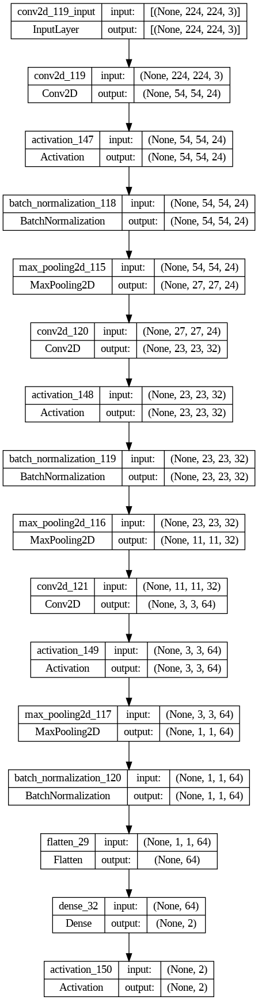

In [ ]:
# Assuming 'model' is your Sequential model
plot_model(model, to_file="./model.png", show_shapes=True, show_layer_names=True)

In [ ]:
with mlflow.start_run() as run:
    mlflow.tensorflow.log_model(model, "Conv2d_5_5_kernel_binary_cross_entopy_softmax_local_response_norm_w_dropout")

2024/03/07 01:06:45 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


In [ ]:
save_path = "Conv2d_5_5_kernel_binary_cross_entopy_softmax_local_response_norm_w_dropout"

In [ ]:
model_loaded = mlflow.tensorflow.load_model(f"runs:/{run.info.run_id}/{save_path}")

2024/03/07 01:14:21 INFO mlflow.store.artifact.artifact_repo: The progress bar can be disabled by setting the environment variable MLFLOW_ENABLE_ARTIFACTS_PROGRESS_BAR to false


In [ ]:
model_loaded.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_43 (Conv2D)          (None, 55, 55, 24)        1824      
                                                                 
 activation_56 (Activation)  (None, 55, 55, 24)        0         
                                                                 
 batch_normalization_12 (Ba  (None, 55, 55, 24)        96        
 tchNormalization)                                               
                                                                 
 max_pooling2d_42 (MaxPooli  (None, 27, 27, 24)        0         
 ng2D)                                                           
                                                                 
 dropout_18 (Dropout)        (None, 27, 27, 24)        0         
                                                                 
 conv2d_44 (Conv2D)          (None, 25, 25, 32)      

32/32 [==============================] - 8s 240ms/step
(1002,)
[0.04084863 0.95915127]


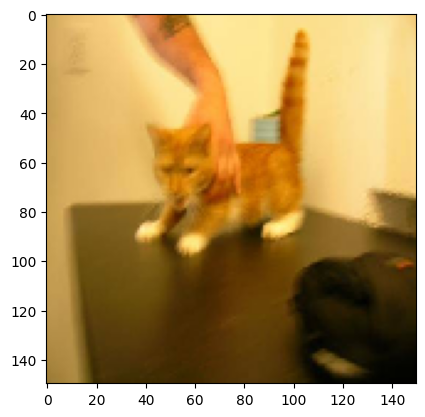

[0.00120261 0.9987974 ]


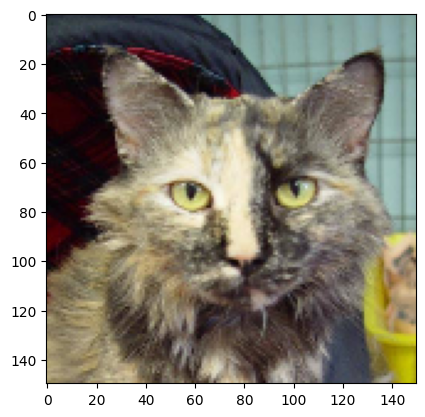

[0.41910738 0.5808927 ]


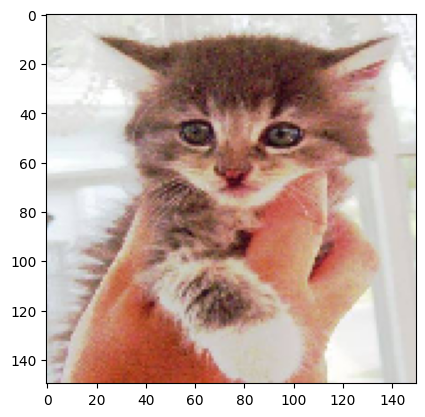

[0.01570682 0.98429316]


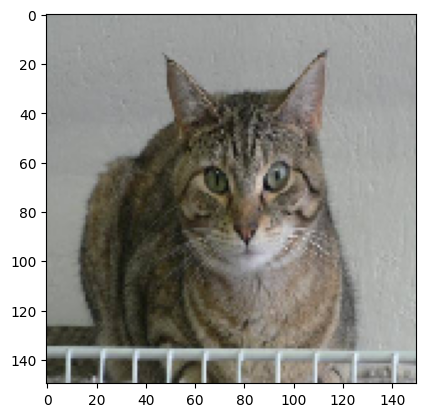

[0.35770774 0.64229214]


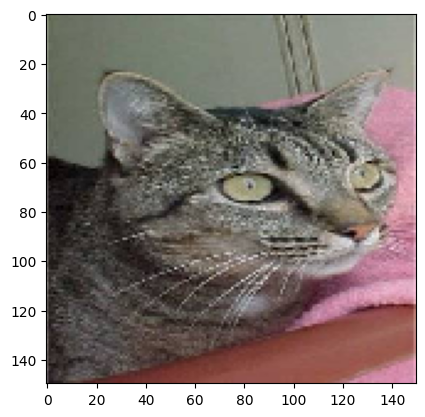

[0.15731373 0.84268624]


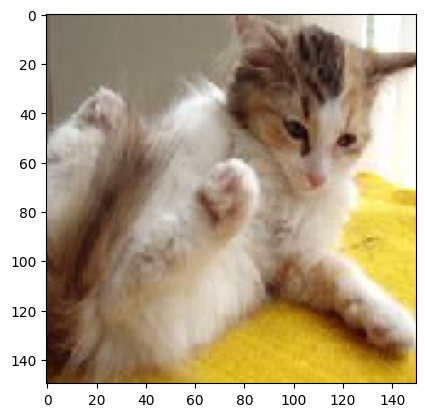

[0.09793267 0.90206736]


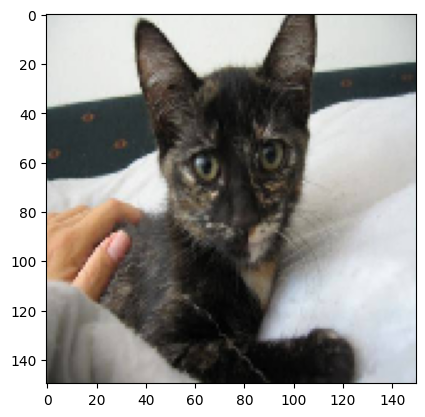

[0.02133385 0.9786662 ]


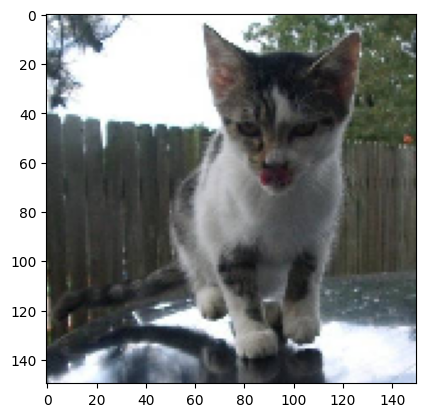

[0.0077094 0.9922905]


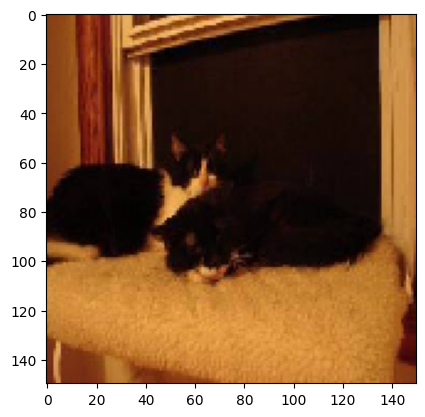

[0.00490843 0.99509156]


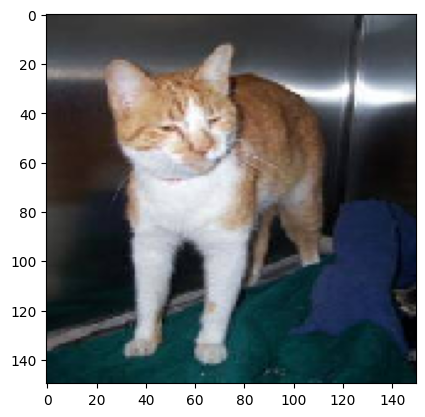

In [ ]:
# Misclassified images
true_labels = train_generator.classes
filepaths = train_generator.filepaths
predictions = model_loaded.predict(train_generator)
predicted_labels = np.argmax(abs(predictions), axis=1)
misclassified_indices = np.where(predicted_labels != true_labels)[0]
misclassified_predictions = predictions[misclassified_indices,:]

print(misclassified_indices.shape)
from keras.preprocessing import image

# Display the first 10 misclassified images
for i in misclassified_indices[:10]:
    img = image.load_img(filepaths[i], target_size=(150, 150))
    print(predictions[i])
    plt.imshow(img)
    plt.show()

In [ ]:
for i in predictions:
  print(i)

[0.01162703 0.98837286]
[6.6156976e-04 9.9933845e-01]
[0.49322748 0.5067726 ]
[9.9976802e-01 2.3195475e-04]
[0.32111546 0.67888445]
[0.50735396 0.49264595]
[0.2894262  0.71057385]
[0.00392505 0.9960749 ]
[0.9247385  0.07526141]
[1.2963414e-05 9.9998695e-01]
[0.01607937 0.9839205 ]
[0.88866484 0.11133511]
[0.9923168  0.00768324]
[0.89933014 0.10066988]
[0.9730607  0.02693933]
[0.63011956 0.3698804 ]
[0.9269784  0.07302151]
[0.00293012 0.99706984]
[0.01743071 0.9825694 ]
[0.7087196  0.29128036]
[0.5055339  0.49446604]
[0.84670365 0.15329632]
[0.5687758  0.43122417]
[0.19229765 0.80770236]
[0.6175848  0.38241518]
[0.987209  0.0127909]
[0.22662318 0.7733768 ]
[0.9919369  0.00806303]
[0.18853751 0.81146246]
[0.56048626 0.43951374]
[0.00242098 0.997579  ]
[0.9777389 0.0222611]
[0.51368386 0.48631606]
[0.7228988  0.27710125]
[0.45589665 0.5441034 ]
[0.9723347  0.02766542]
[0.12722112 0.8727789 ]
[0.4975188 0.5024813]
[0.93343025 0.06656969]
[0.99279314 0.00720676]
[0.9910024 0.0089976]
[0.341

In [ ]:
misclassified_indices.shape

(491,)

In [ ]:
# Assume 'model' is your trained model
weights = model.layers[0].get_weights()[0]
# Normalize the weights to 0 to 1 for visualization
weights = (weights - weights.min()) / (weights.max() - weights.min())

In [ ]:
weights.shape

(5, 5, 3, 24)

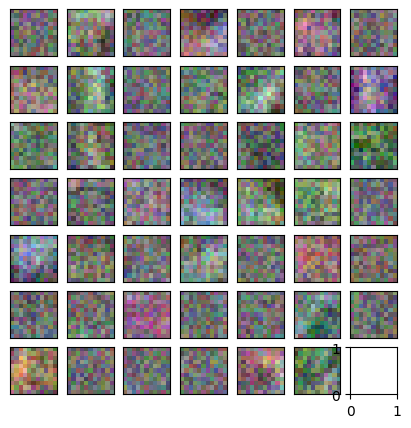

In [ ]:
import matplotlib.pyplot as plt

# Assume your model is using 32 filters of size 3x3
fig, axs = plt.subplots(7, 7, figsize=(5,5))
axs = axs.ravel()
for i in range(48):  # We are assuming 32 filters
    axs[i].imshow(weights[:, :, :, i].squeeze(), cmap='gray')
    #axs[i].set_title('Filter ' + str(i))
    axs[i].set_xticks([])
    axs[i].set_yticks([])
plt.show()

TypeError: Invalid shape (3, 3, 24) for image data

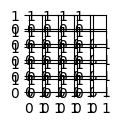

In [ ]:
import matplotlib.pyplot as plt

# Assume your model is using 32 filters of size 3x3
fig, axs = plt.subplots(5, 5, figsize=(1,1))
axs = axs.ravel()
for i in range(24):  # We are assuming 32 filters
    axs[i].imshow(weights[:, :, :, i].squeeze(), cmap='gray')
    #axs[i].set_title('Filter ' + str(i))
    axs[i].set_xticks([])
    axs[i].set_yticks([])
plt.show()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./logs/fit/

<IPython.core.display.Javascript object>

In [ ]:
# Replace 'your-key-file.json' with the name of your service account key file
creds = Credentials.from_service_account_file('myboschproject-c9f1adcd56d2.json', scopes=["https://www.googleapis.com/auth/cloud-platform"])

# Use the credentials to authorize your session
fs = gcsfs.GCSFileSystem(project='myboschproject', token=creds)

In [ ]:
image = Image.open(fs.open('gs://deep_learning_exps/PhotoFrame1.jpg'))

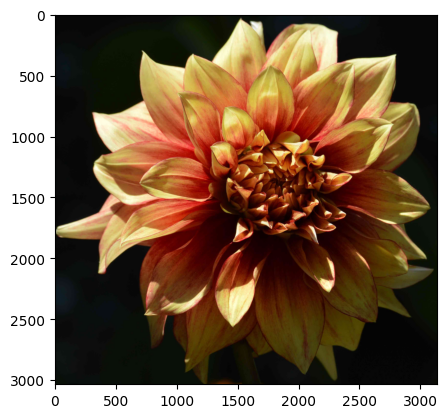

In [ ]:
plt.imshow(image)

In [ ]:
img_gray = image.convert('L').resize((100,100))

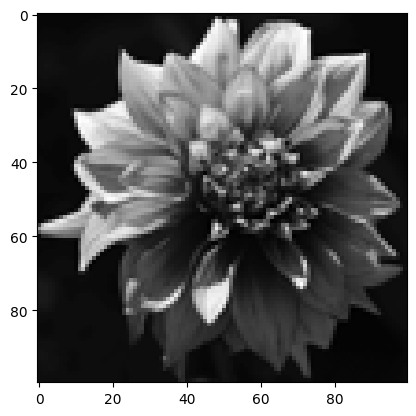

In [ ]:
plt.imshow(img_gray, cmap="gray")

In [ ]:
image.size, img_gray.size

((3134, 3034), (100, 100))

In [ ]:
np.array(image).shape, np.array(img_gray).shape

((3034, 3134, 3), (3034, 3134))

In [ ]:
kernel = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]
], dtype=np.float32)

In [ ]:
convolved = convolve(np.array(img_gray), kernel)

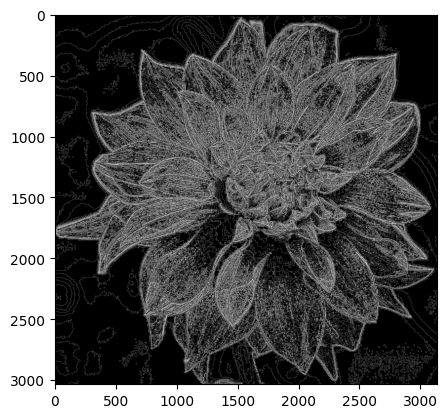

In [ ]:
plt.imshow(convolved, cmap="gray")

In [ ]:
np.array(img_gray).max()

255

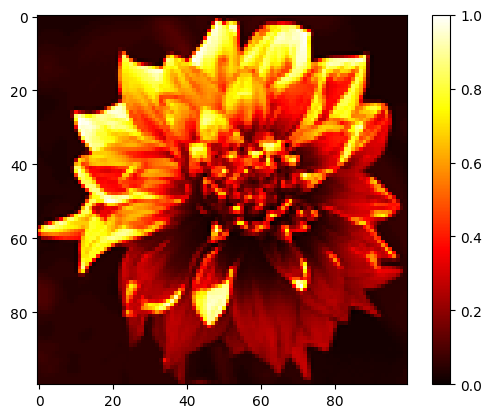

In [ ]:
plt.imshow(np.array(img_gray)/255.0, cmap="hot")
plt.colorbar()

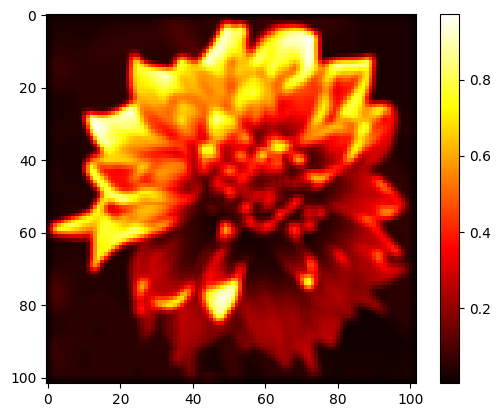

In [ ]:
kernel2 = np.array([[ 1/9, 1/9, 1/9],
 [ 1/9, 1/9, 1/9],
 [ 1/9, 1/9, 1/9]]
, dtype=np.float32)
img_convolve = convolve2d(np.array(img_gray)/255.0, kernel2)
plt.imshow(img_convolve, cmap="hot")
plt.colorbar()

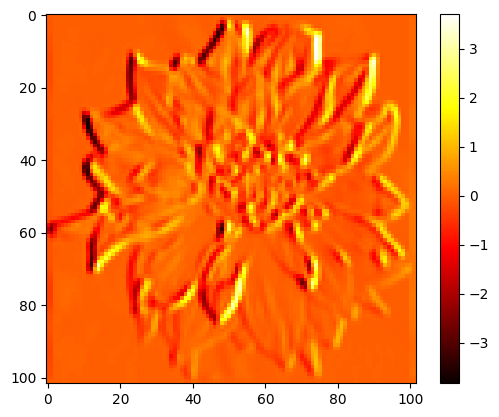

In [ ]:
kernel2 = np.array([[ -1, 0, 1],
 [ -2, 0, 2],
 [ -1, 0, 1]]
, dtype=np.float32)
img_convolve = convolve2d(np.array(img_gray)/255.0, kernel2)
plt.imshow(img_convolve, cmap="hot")
plt.colorbar()

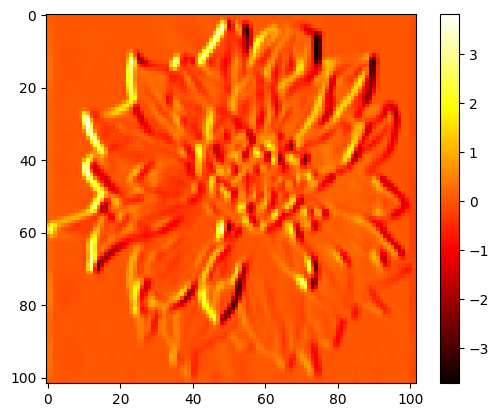

In [ ]:
kernel2 = np.array([[ 1, 0, -1],
 [ 2, 0, -2],
 [ 1, 0, -1]]
, dtype=np.float32)
img_convolve = convolve2d(np.array(img_gray)/255.0, kernel2)
plt.imshow(img_convolve, cmap="hot")
plt.colorbar()

In [ ]:
# Load the dataset
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)
# Define the directories
train_dir = "/root/.keras/datasets/cats_and_dogs_filtered/train"
validation_dir = "/root/.keras/datasets/cats_and_dogs_filtered/validation"

68606236/68606236 [==============================] - 1s 0us/step


In [ ]:
path_to_zip

'/root/.keras/datasets/cats_and_dogs.zip'

In [ ]:
!ls /root/.keras/datasets/cats_and_dogs_filtered/train

cats  dogs


In [ ]:
# Define the directories
train_dir = "/root/.keras/datasets/cats_and_dogs_filtered/train"
validation_dir = "/root/.keras/datasets/cats_and_dogs_filtered/validation"

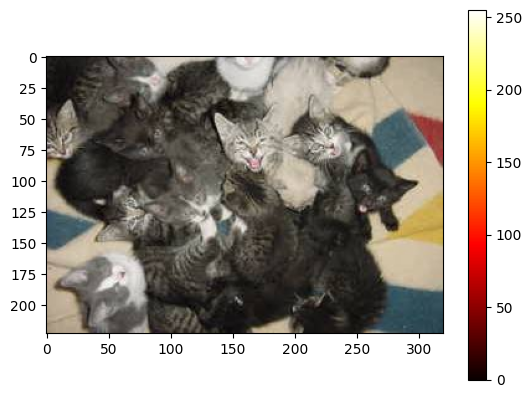

In [ ]:
cat_sample = Image.open(train_dir+"/cats/cat.19.jpg")
plt.imshow(cat_sample, cmap="hot")
plt.colorbar()

In [ ]:
np.array(cat_sample).shape

(223, 320, 3)

In [ ]:
# Create ImageDataGenerators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
# Load images from the disk, applies rescaling, and resizes the images
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    color_mode="grayscale")

validation_generator = val_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='binary',
    color_mode="grayscale")

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
